In [1]:
import torch
import torchvision
import pytorch_lightning as pl
from torch.utils.data import DataLoader
from era_data import TabletPeriodDataset, get_IDS
from collections import Counter
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import pandas as pd  
from VAE_model_tablets_class import VAE
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import multiprocessing
from tqdm import tqdm

In [31]:
# IMG_DIR = 'output/images'
RUN_NAME_SUFFIX = '-masked_w_classification_loss' # ''
IMG_DIR = 'output/images_preprocessed'
LR = 5e-5
EPOCHS = 30
BATCH_SIZE = 16
SUFFIX = '-resnet50'
DATE = 'Oct2'

In [32]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [33]:
IDS = get_IDS(IMG_DIR=IMG_DIR)
len(IDS)

97640

In [34]:
VERSION_NAME = f'period_clf_bs{BATCH_SIZE}_lr{LR}_{EPOCHS}epochs{SUFFIX}-{len(IDS)}_samples{RUN_NAME_SUFFIX}_blurvae-conv-{DATE}'
VERSION_NAME

'period_clf_bs16_lr5e-05_30epochs-resnet50-97640_samples-masked_w_classification_loss_blurvae-conv-Oct2'

In [35]:
VERNAME = 'period_clf_bs16_lr5e-05_15epochs-resnet50-97640_samples-masked-Sept_19_blur-early_stopping-1'
train_ids = pd.read_csv(f'output/clf_ids/period-train-{VERNAME}.csv', header=None)[0].astype(str)
test_ids = pd.read_csv(f'output/clf_ids/period-test-{VERNAME}.csv', header=None)[0].astype(str)

In [36]:
ds_train = TabletPeriodDataset(IDS=train_ids, IMG_DIR=IMG_DIR, mask=True)
ds_test = TabletPeriodDataset(IDS=test_ids, IMG_DIR=IMG_DIR, mask=True)

Filtering 97640 IDS down to provided 97140...
Filtering 97640 IDS down to provided 500...


In [37]:
import numpy as np
from PIL import Image

def collate_fn(batch):
    # Unsqueeze the matrix (the first element of each tuple)
    
    unsqueezed_data = [torch.from_numpy(np.array(Image.fromarray(sample[0]).resize((178, 218), Image.NEAREST))).unsqueeze(0).unsqueeze(0) for sample in batch]
    labels = torch.from_numpy(np.array([sample[1] for sample in batch]))

    # Concatenate the unsqueezed matrices into a new tensor
    unsqueezed_batch_data = torch.cat(unsqueezed_data, dim=0)

    return unsqueezed_batch_data, labels

In [38]:
dl_train = DataLoader(ds_train, batch_size=7, shuffle=True, num_workers=4, collate_fn = collate_fn, pin_memory=True)
dl_test = DataLoader(ds_test, batch_size=7, shuffle=False, num_workers=4, collate_fn = collate_fn, pin_memory=True)

In [39]:
for batch in dl_train:
    x, y = batch
    print(x.shape,y.shape)
    break

torch.Size([7, 1, 218, 178]) torch.Size([7])


In [40]:
# import warnings
import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor
logger = pl.loggers.TensorBoardLogger(
    save_dir='.',
    name='lightning_logs',
    version=VERSION_NAME
)

In [41]:
lr_monitor = LearningRateMonitor(logging_interval='step')

In [42]:
num_classes = len(TabletPeriodDataset.PERIOD_INDICES)
num_classes

22

In [43]:
def compute_class_weights(dataloader, num_classes, epsilon=1e-6):
    class_counts = torch.zeros(num_classes)
    for _, labels in dataloader:
        unique, counts = labels.unique(return_counts=True)
        class_counts[unique] += counts
        
    # Add epsilon to avoid division by zero
    class_weights = len(dataloader.dataset) / (num_classes * (class_counts + epsilon))
    return class_weights

In [44]:
#class_weights = compute_class_weights(dl_train, num_classes)
# torch.save(class_weights, "data/class_weights_period.pt")
class_weights = torch.load("data/class_weights_period.pt")

In [ ]:
model = VAE(image_channels=1, z_dim=16, lr =1e-5, use_classification_loss=True, num_classes=num_classes,
            loss_type="weighted", class_weights=class_weights, device = device) # z_dim = size of embeddings bottleneck
trainer = pl.Trainer(accelerator='gpu', callbacks=[lr_monitor], max_epochs = EPOCHS, devices='auto', 
                     val_check_interval=0.2, logger=logger,) # train 
trainer.fit(model, dl_train, dl_test) 

/sise/mickyfi-group/kapond/AnalysisBySynthesis/VAE_model_tablets_class.py:95: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.class_weights = torch.tensor(class_weights).to(device)
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/kapond/.conda/envs/dani_torch/lib/python3.11/s ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type             | Params
---------------------------------

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [19]:
chekpoint_path = f'lightning_logs/{VERSION_NAME}/checkpoints/epoch=14-step=203756.ckpt'
model_resume = VAE.load_from_checkpoint(chekpoint_path,image_channels=1,z_dim=16, lr =1e-5, use_classification_loss=True, num_classes=num_classes,
            loss_type="weighted", class_weights=class_weights, device = device)

/sise/mickyfi-group/kapond/AnalysisBySynthesis/VAE_model_tablets_class.py:95: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.class_weights = torch.tensor(class_weights).to(device)


*****************************************************************************************************************
torch.Size([218, 178])


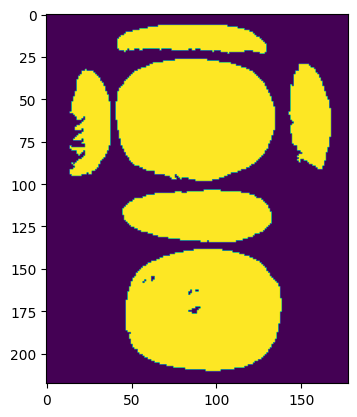

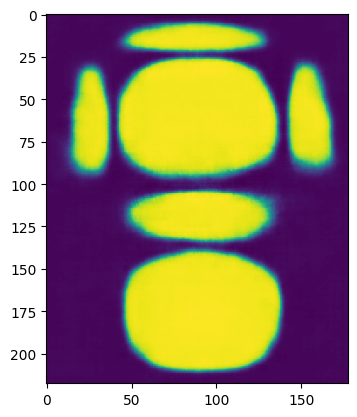

*****************************************************************************************************************
torch.Size([218, 178])


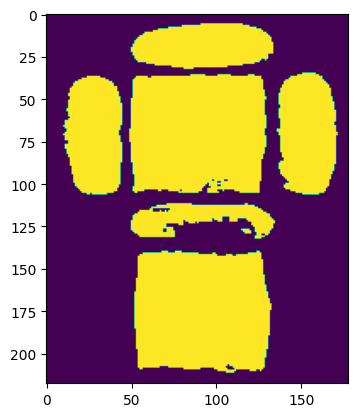

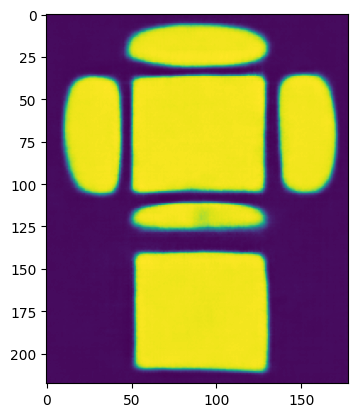

*****************************************************************************************************************
torch.Size([218, 178])


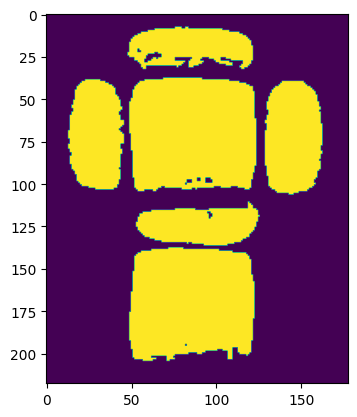

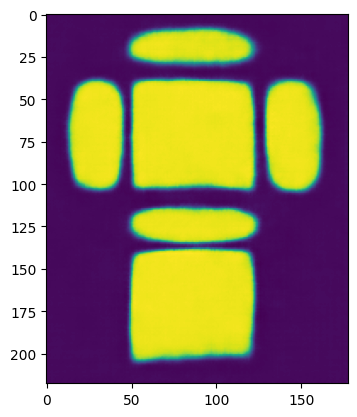

*****************************************************************************************************************
torch.Size([218, 178])


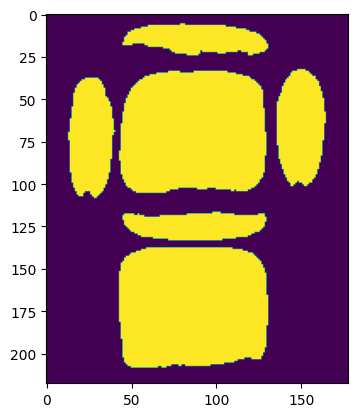

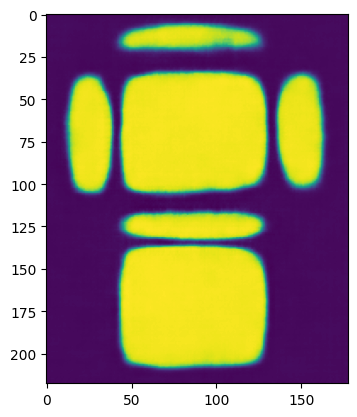

*****************************************************************************************************************
torch.Size([218, 178])


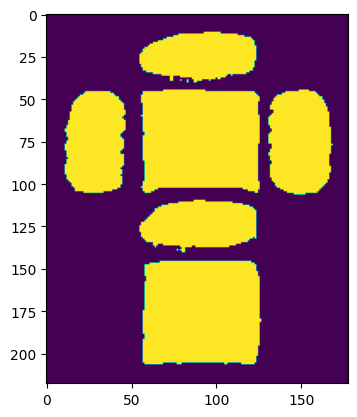

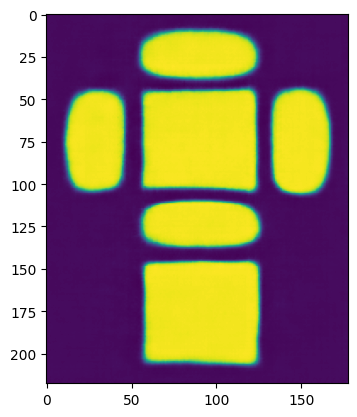

*****************************************************************************************************************
torch.Size([218, 178])


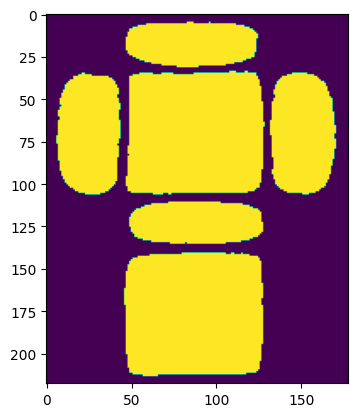

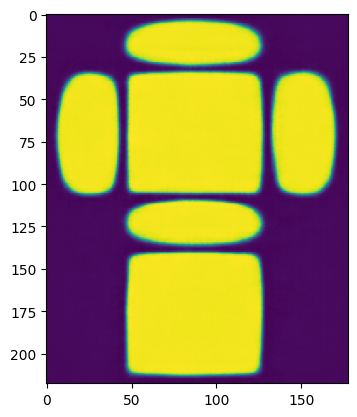

end of epoch 0
*****************************************************************************************************************
torch.Size([218, 178])


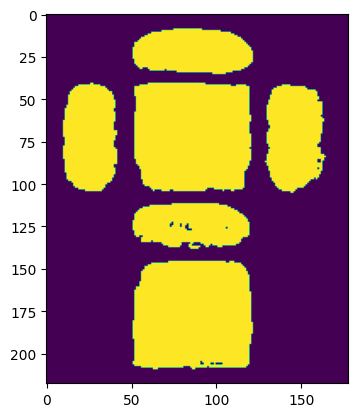

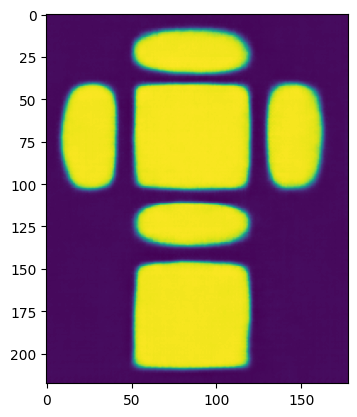

*****************************************************************************************************************
torch.Size([218, 178])


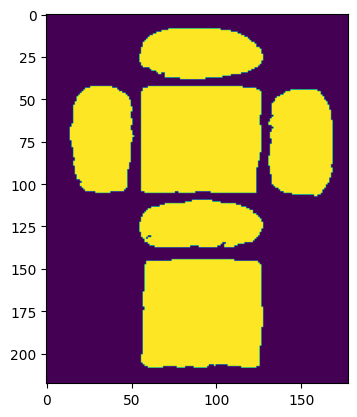

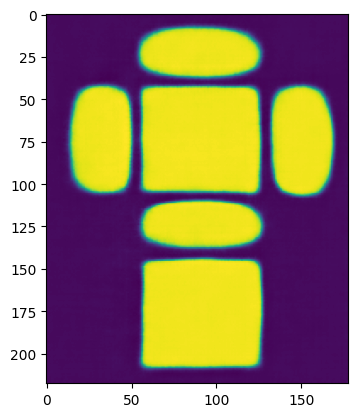

*****************************************************************************************************************
torch.Size([218, 178])


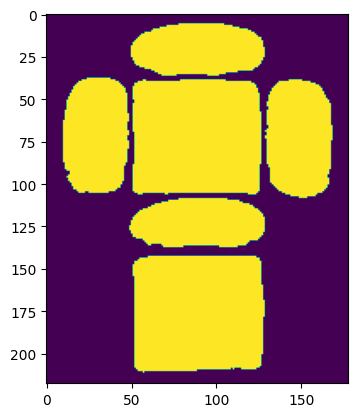

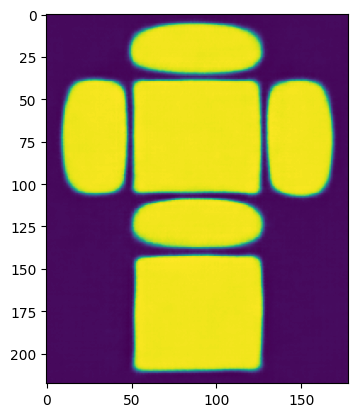

*****************************************************************************************************************
torch.Size([218, 178])


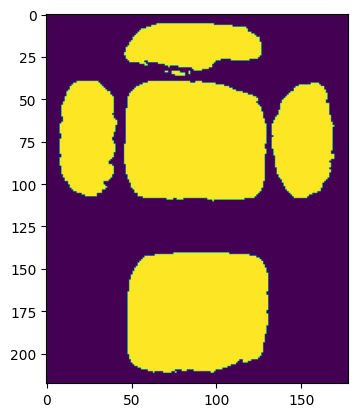

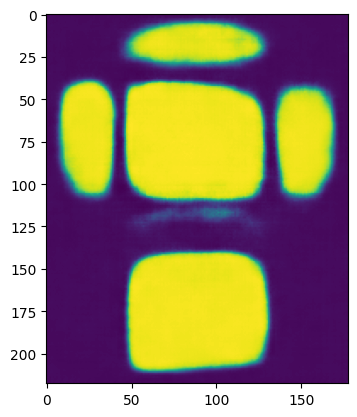

*****************************************************************************************************************
torch.Size([218, 178])


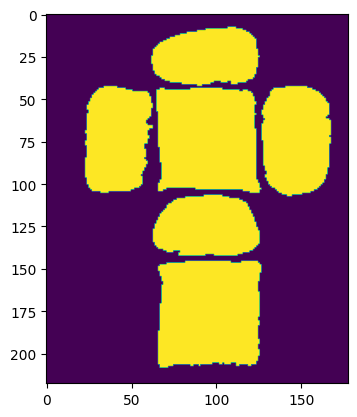

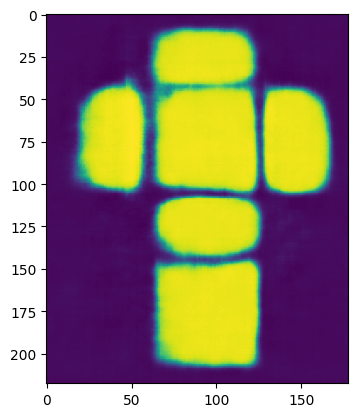

*****************************************************************************************************************
torch.Size([218, 178])


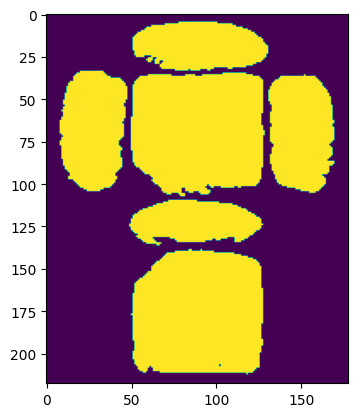

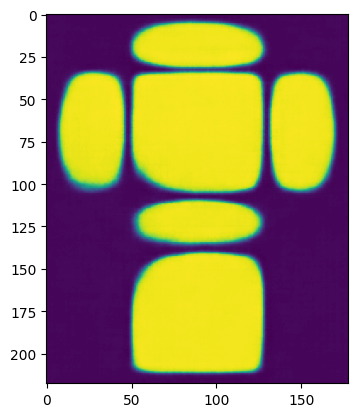

end of epoch 1
*****************************************************************************************************************
torch.Size([218, 178])


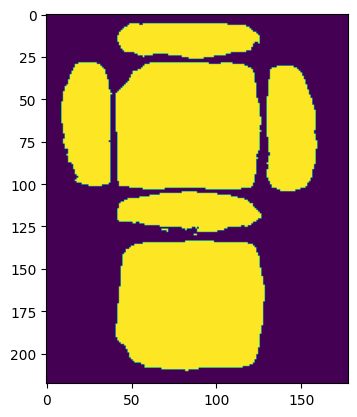

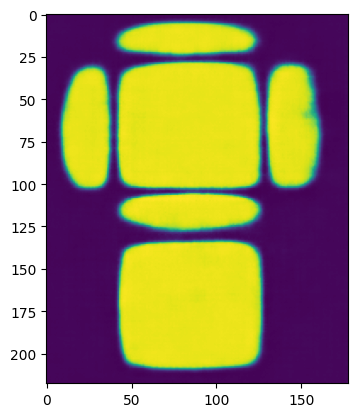

*****************************************************************************************************************
torch.Size([218, 178])


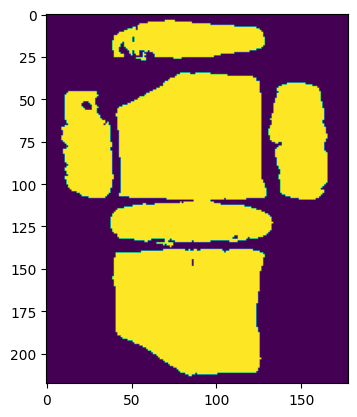

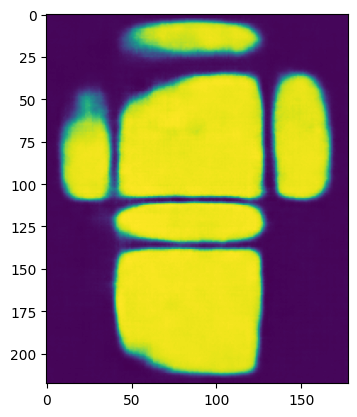

*****************************************************************************************************************
torch.Size([218, 178])


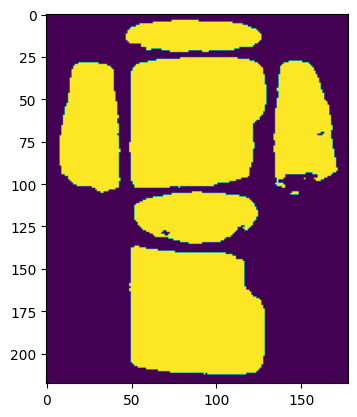

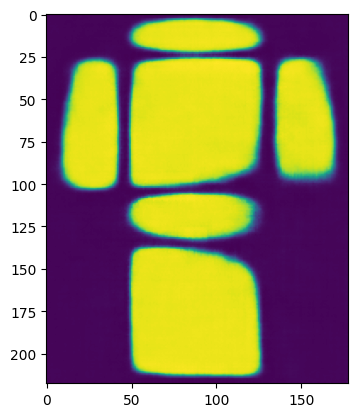

*****************************************************************************************************************
torch.Size([218, 178])


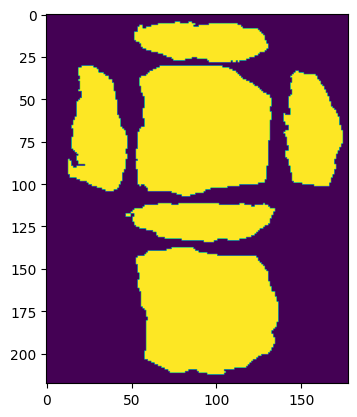

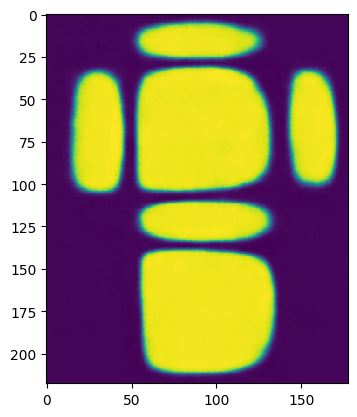

*****************************************************************************************************************
torch.Size([218, 178])


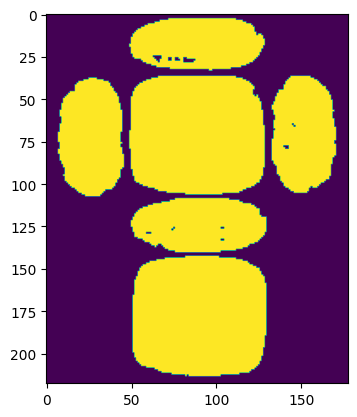

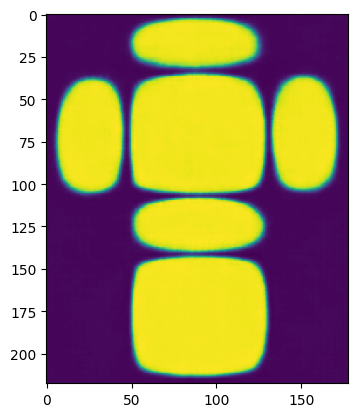

*****************************************************************************************************************
torch.Size([218, 178])


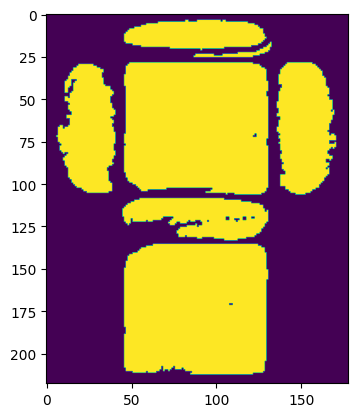

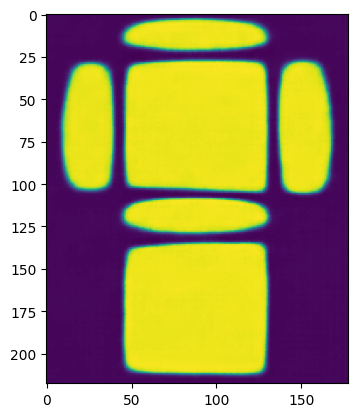

end of epoch 2
*****************************************************************************************************************
torch.Size([218, 178])


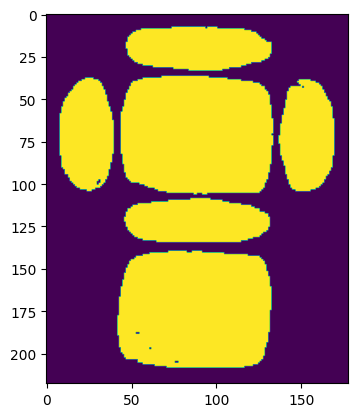

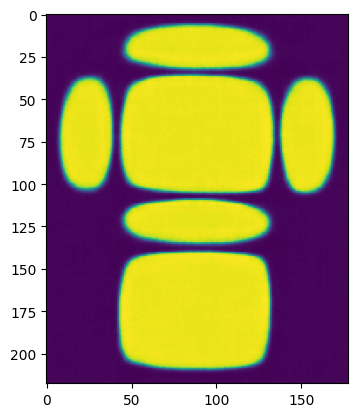

*****************************************************************************************************************
torch.Size([218, 178])


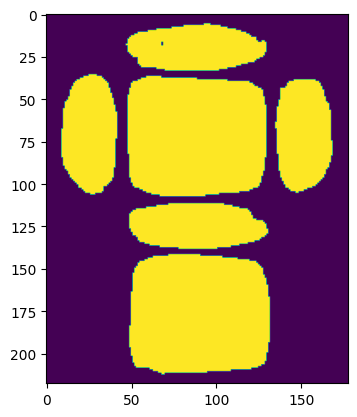

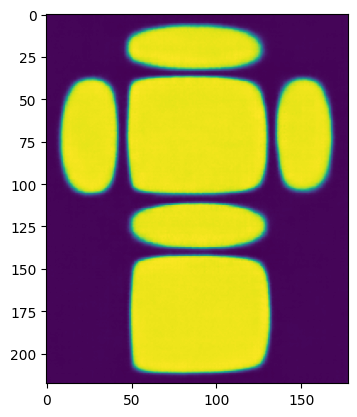

*****************************************************************************************************************
torch.Size([218, 178])


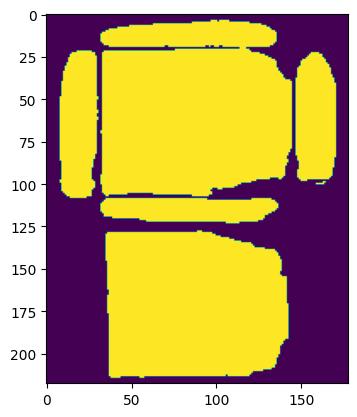

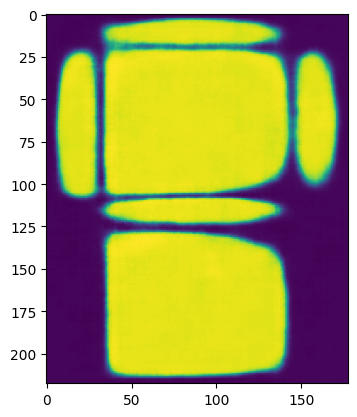

*****************************************************************************************************************
torch.Size([218, 178])


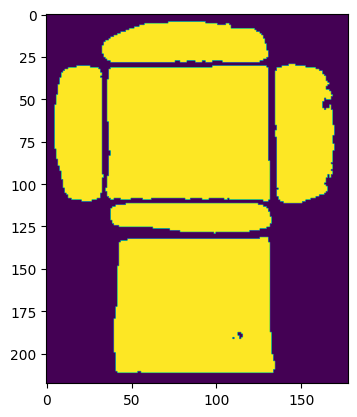

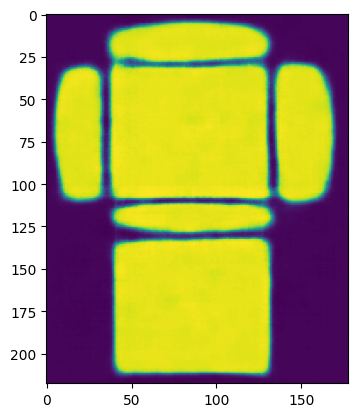

*****************************************************************************************************************
torch.Size([218, 178])


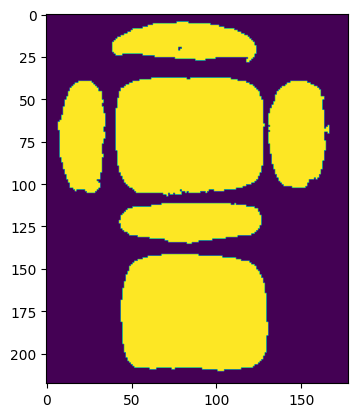

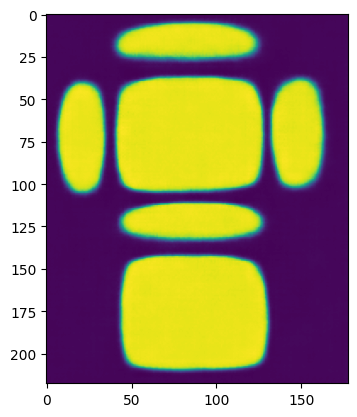

*****************************************************************************************************************
torch.Size([218, 178])


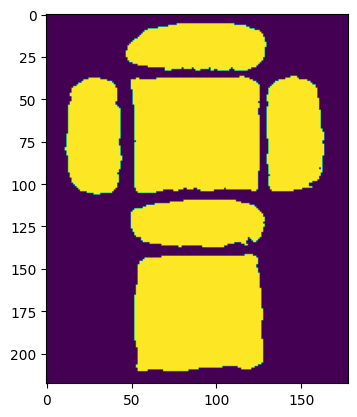

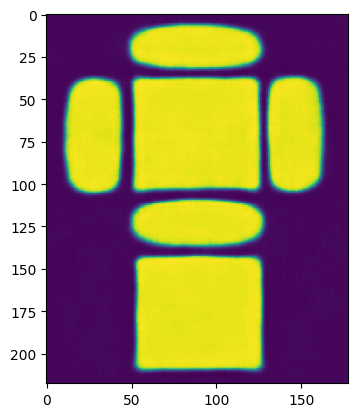

end of epoch 3
*****************************************************************************************************************
torch.Size([218, 178])


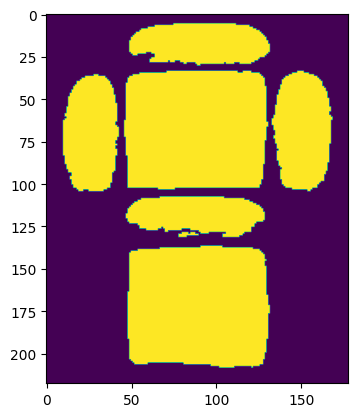

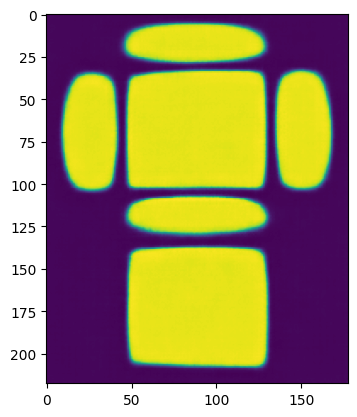

*****************************************************************************************************************
torch.Size([218, 178])


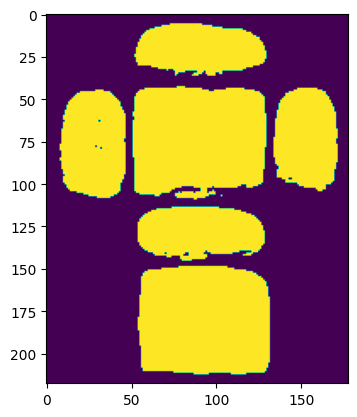

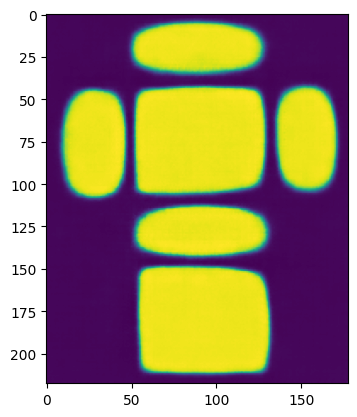

*****************************************************************************************************************
torch.Size([218, 178])


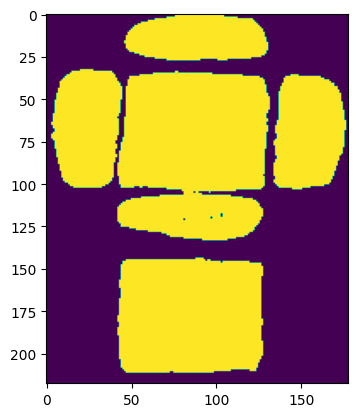

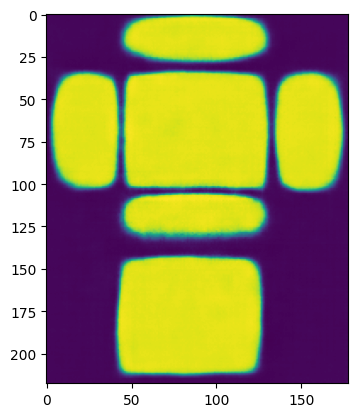

*****************************************************************************************************************
torch.Size([218, 178])


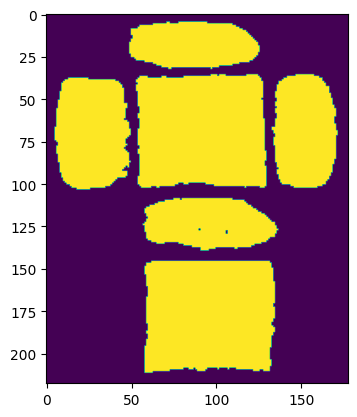

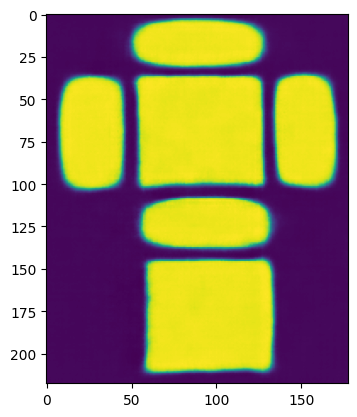

*****************************************************************************************************************
torch.Size([218, 178])


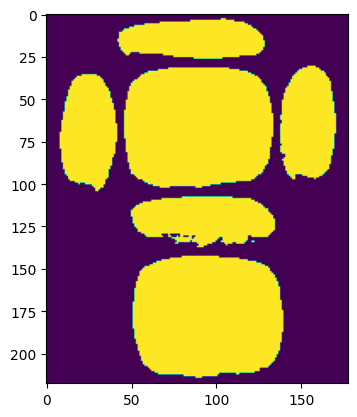

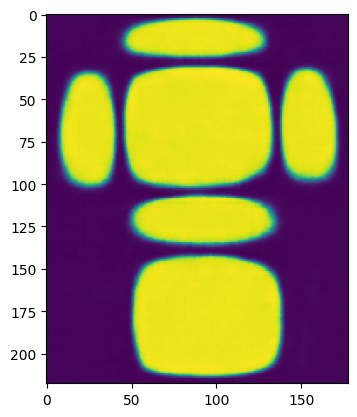

*****************************************************************************************************************
torch.Size([218, 178])


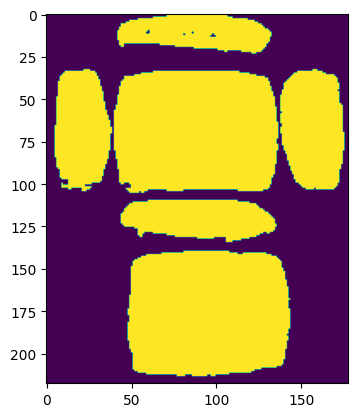

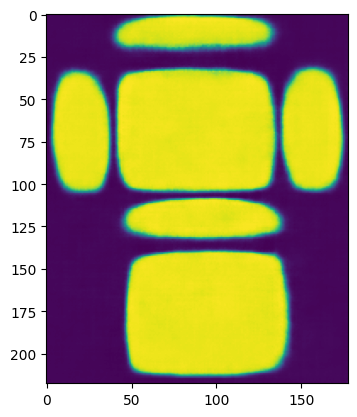

end of epoch 4
*****************************************************************************************************************
torch.Size([218, 178])


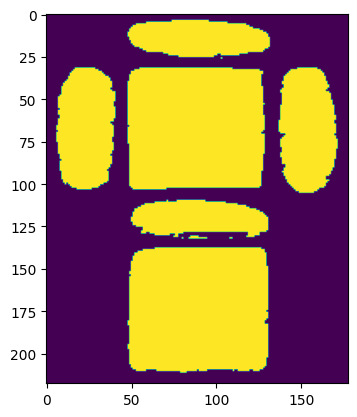

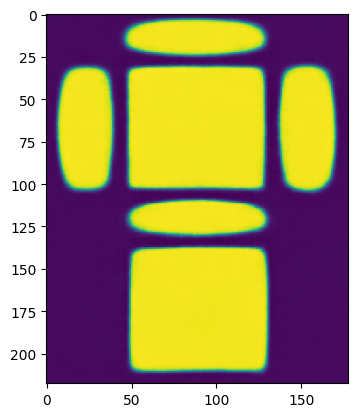

*****************************************************************************************************************
torch.Size([218, 178])


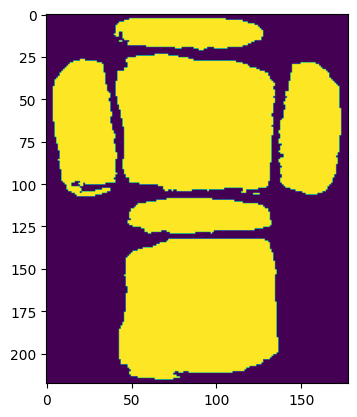

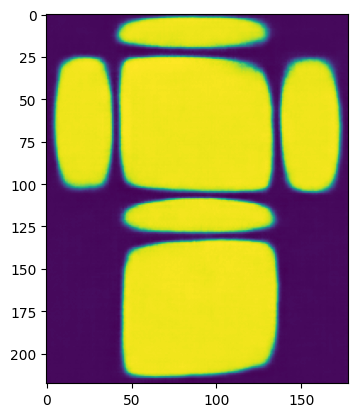

*****************************************************************************************************************
torch.Size([218, 178])


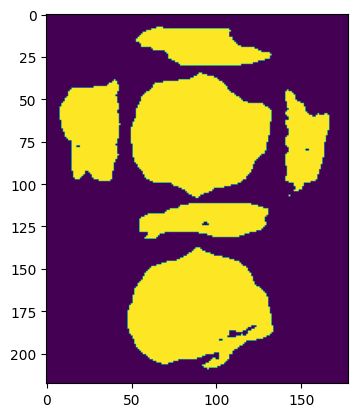

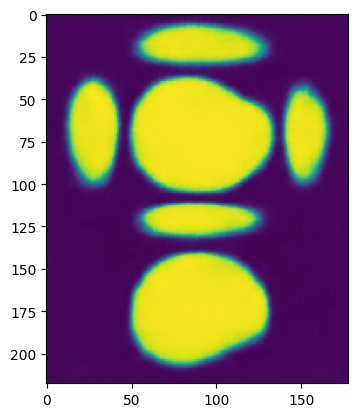

*****************************************************************************************************************
torch.Size([218, 178])


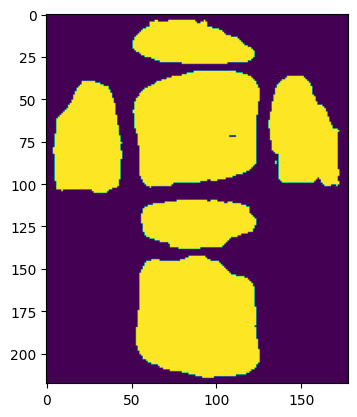

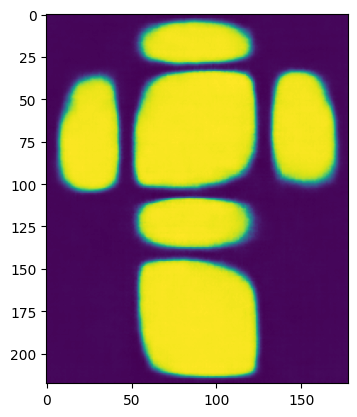

*****************************************************************************************************************
torch.Size([218, 178])


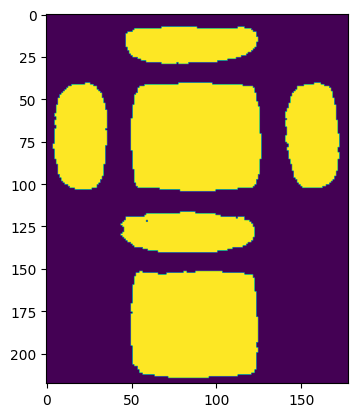

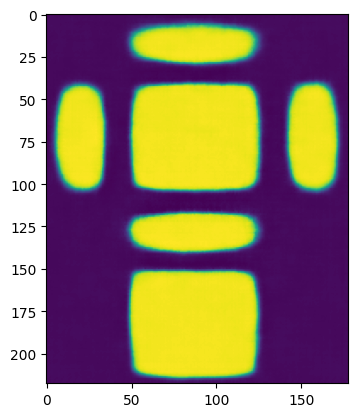

*****************************************************************************************************************
torch.Size([218, 178])


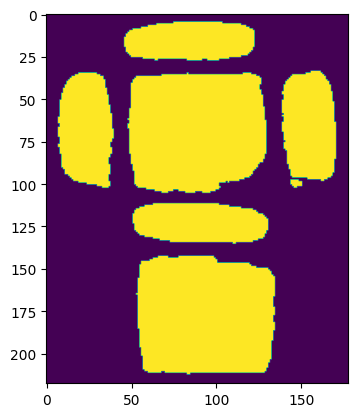

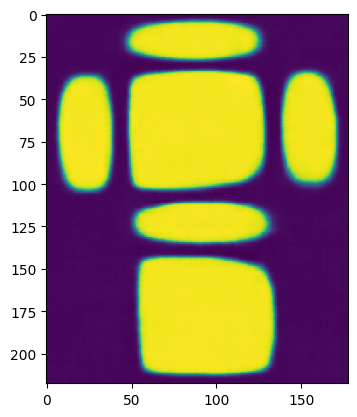

end of epoch 5
*****************************************************************************************************************
torch.Size([218, 178])


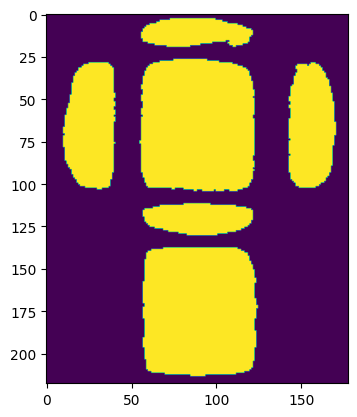

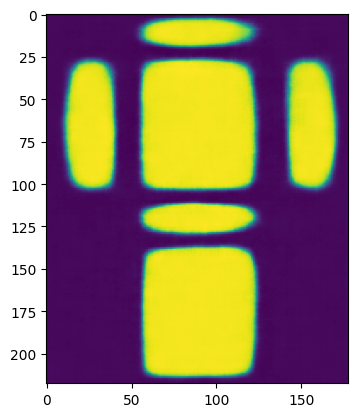

*****************************************************************************************************************
torch.Size([218, 178])


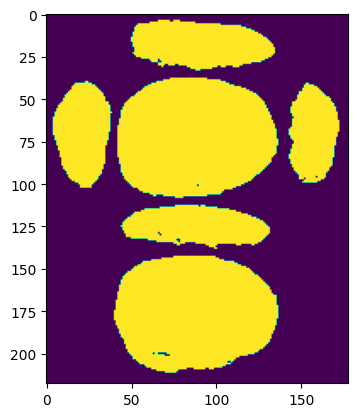

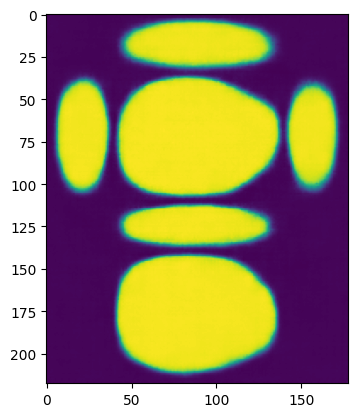

*****************************************************************************************************************
torch.Size([218, 178])


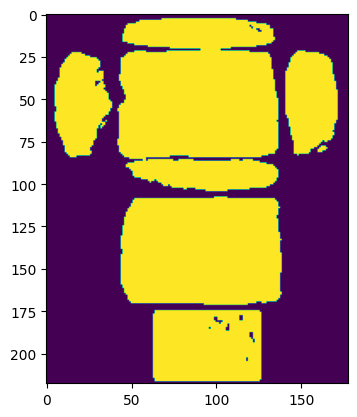

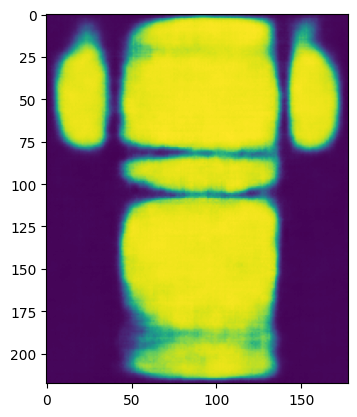

*****************************************************************************************************************
torch.Size([218, 178])


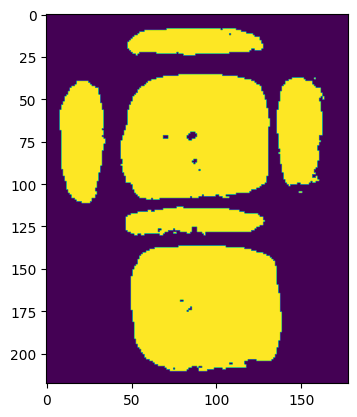

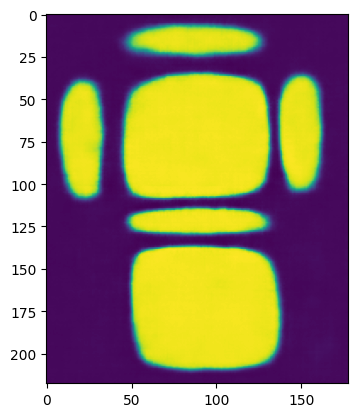

*****************************************************************************************************************
torch.Size([218, 178])


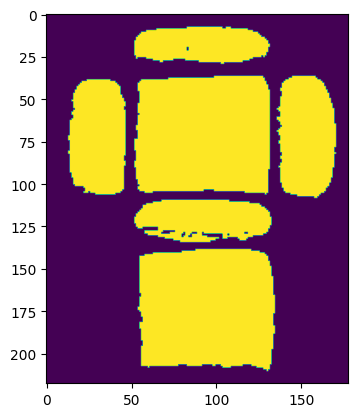

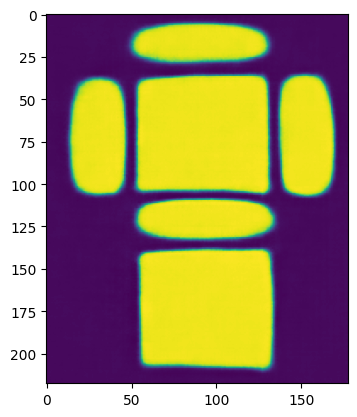

*****************************************************************************************************************
torch.Size([218, 178])


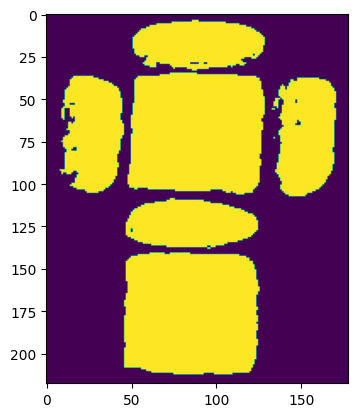

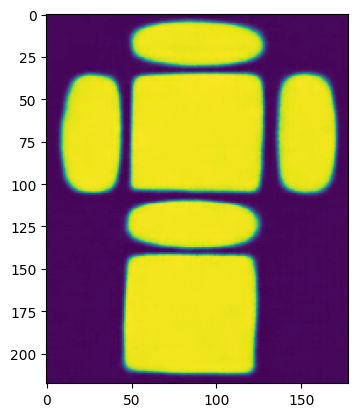

end of epoch 6
*****************************************************************************************************************
torch.Size([218, 178])


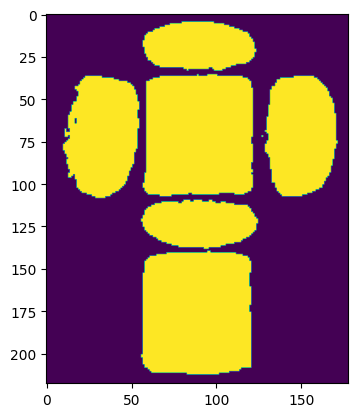

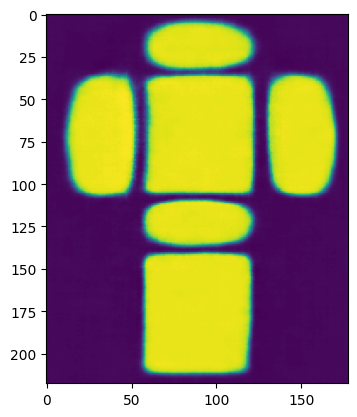

*****************************************************************************************************************
torch.Size([218, 178])


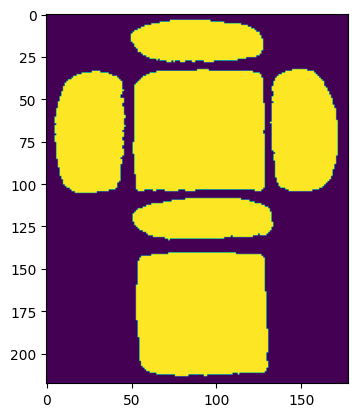

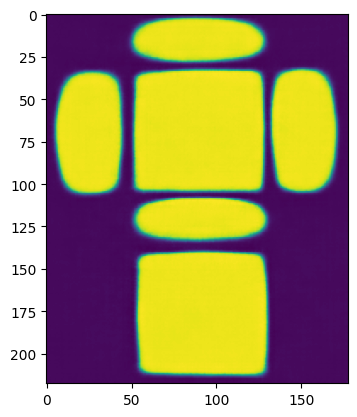

*****************************************************************************************************************
torch.Size([218, 178])


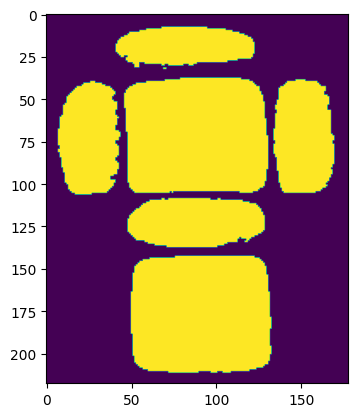

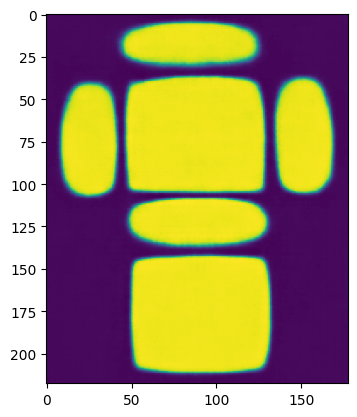

*****************************************************************************************************************
torch.Size([218, 178])


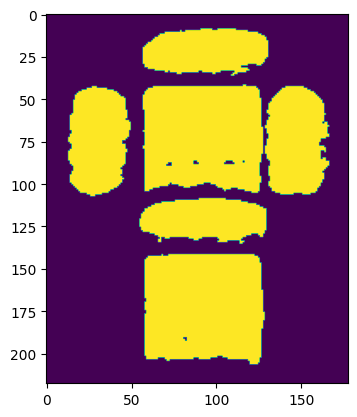

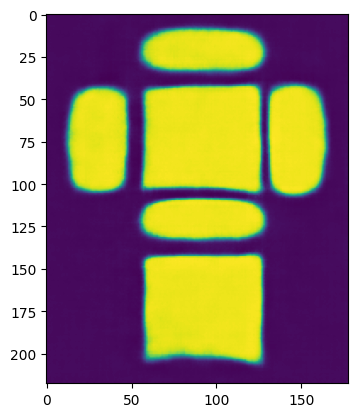

*****************************************************************************************************************
torch.Size([218, 178])


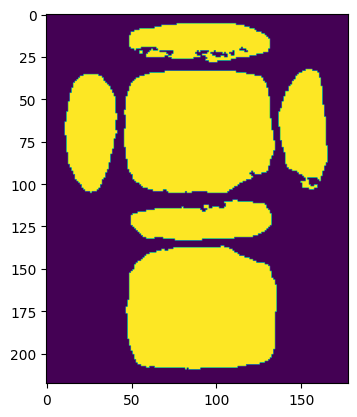

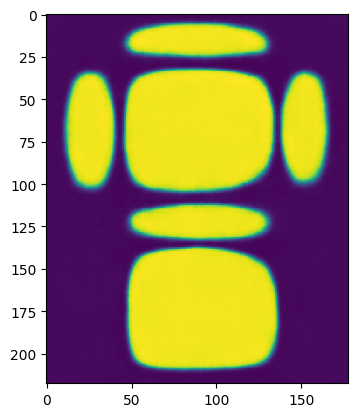

*****************************************************************************************************************
torch.Size([218, 178])


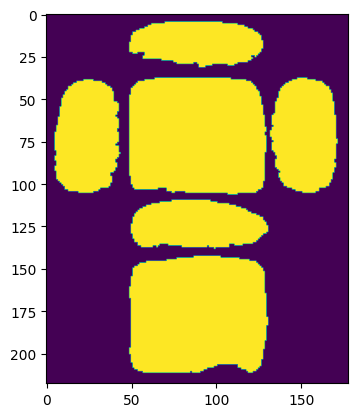

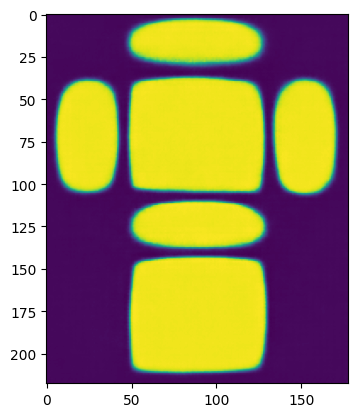

end of epoch 7
*****************************************************************************************************************
torch.Size([218, 178])


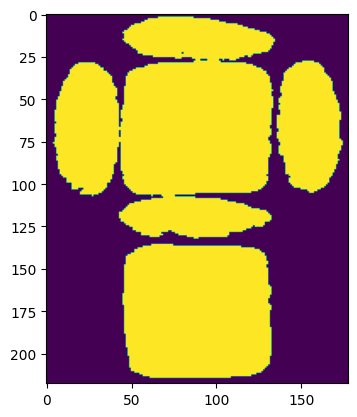

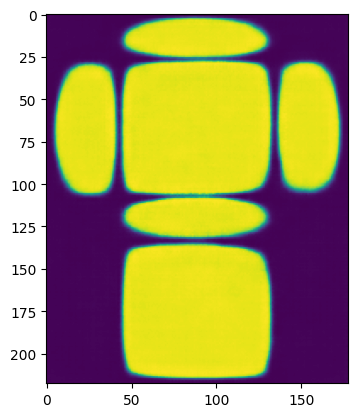

*****************************************************************************************************************
torch.Size([218, 178])


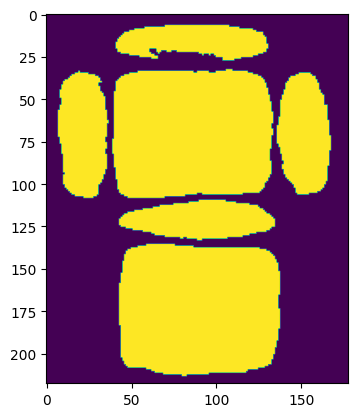

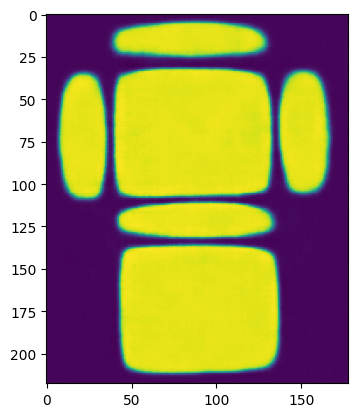

*****************************************************************************************************************
torch.Size([218, 178])


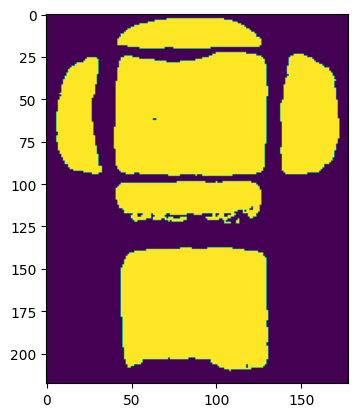

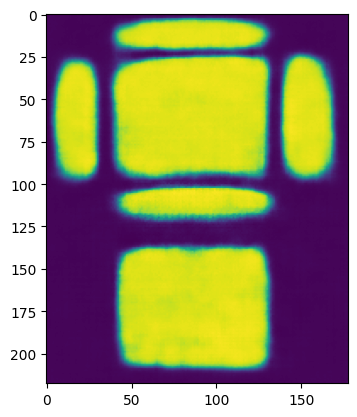

*****************************************************************************************************************
torch.Size([218, 178])


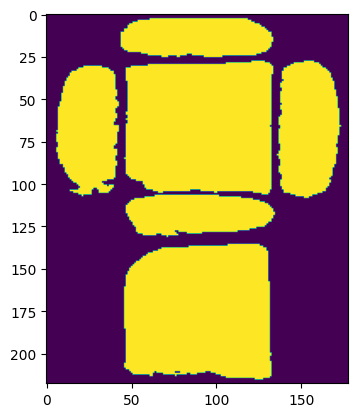

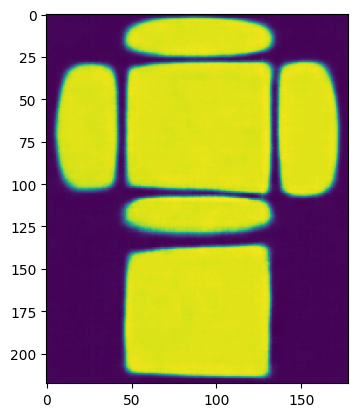

*****************************************************************************************************************
torch.Size([218, 178])


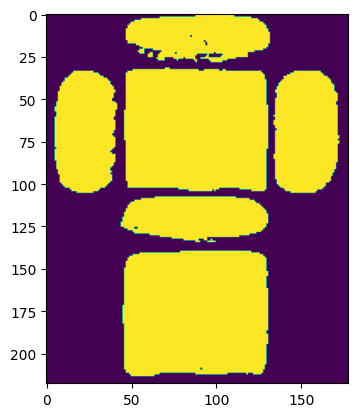

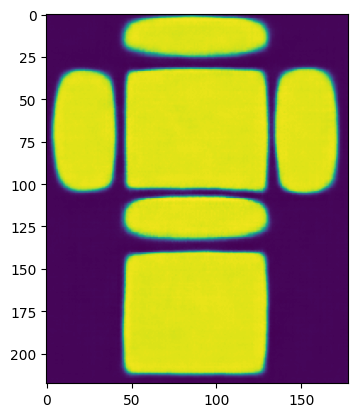

*****************************************************************************************************************
torch.Size([218, 178])


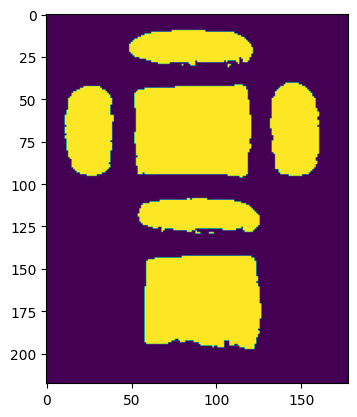

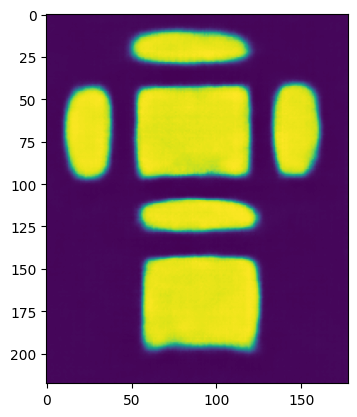

end of epoch 8
*****************************************************************************************************************
torch.Size([218, 178])


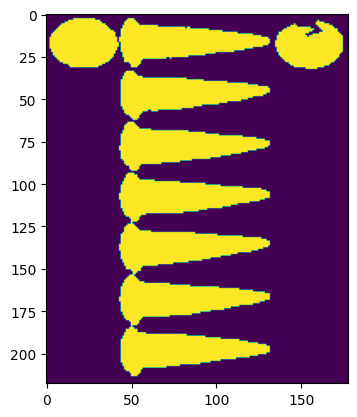

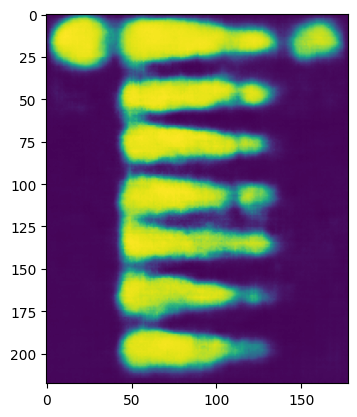

*****************************************************************************************************************
torch.Size([218, 178])


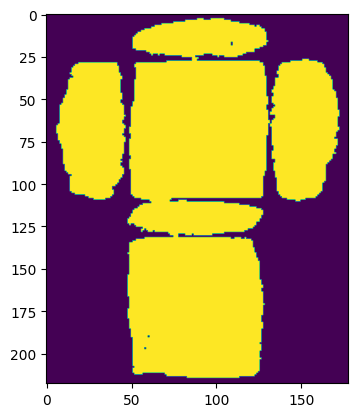

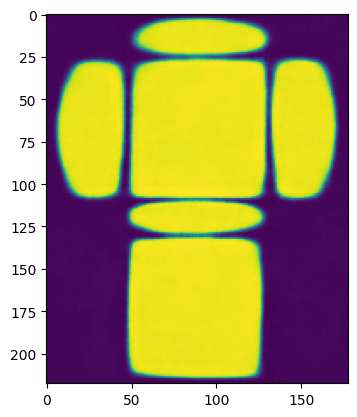

*****************************************************************************************************************
torch.Size([218, 178])


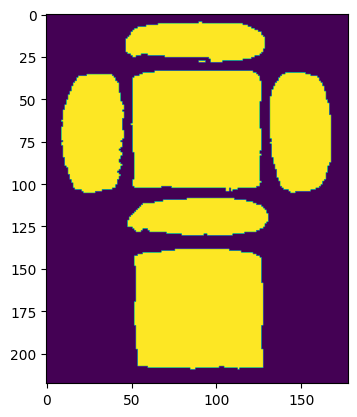

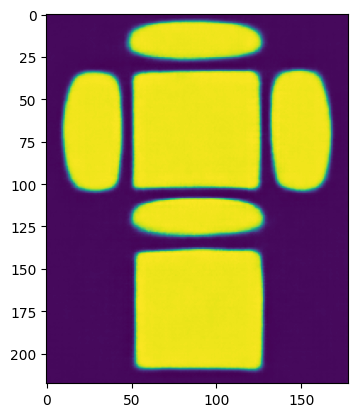

*****************************************************************************************************************
torch.Size([218, 178])


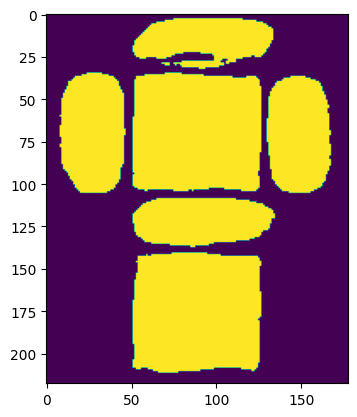

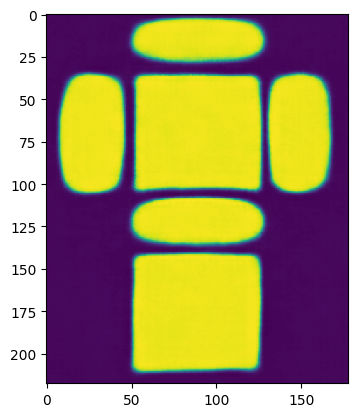

*****************************************************************************************************************
torch.Size([218, 178])


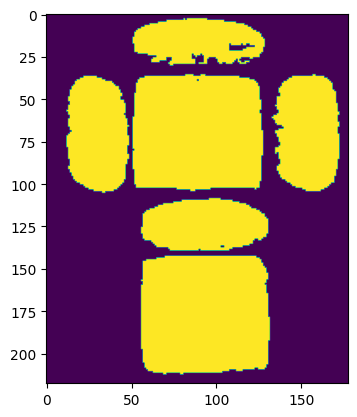

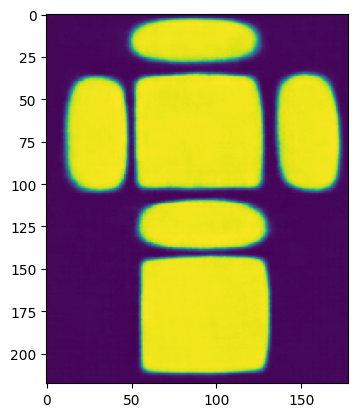

*****************************************************************************************************************
torch.Size([218, 178])


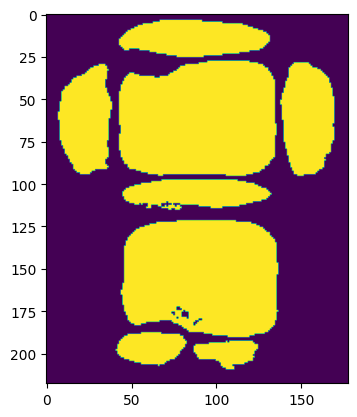

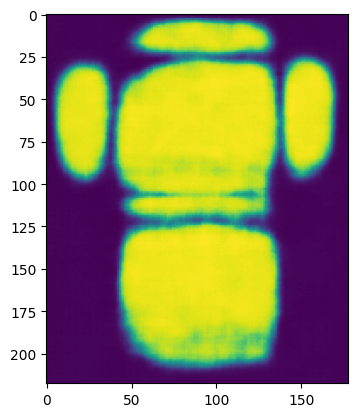

end of epoch 9
*****************************************************************************************************************
torch.Size([218, 178])


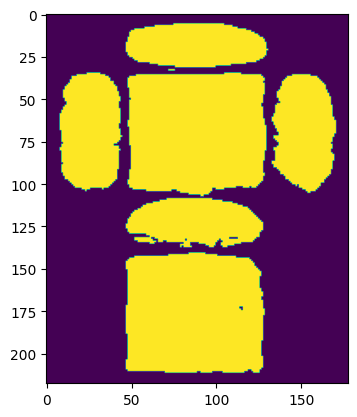

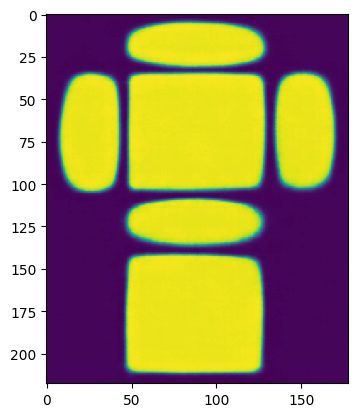

*****************************************************************************************************************
torch.Size([218, 178])


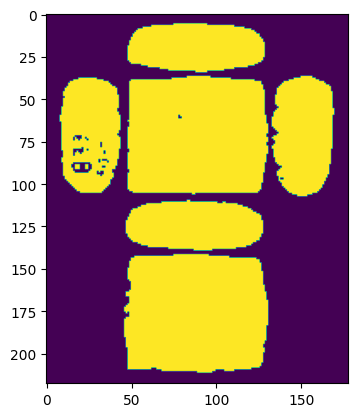

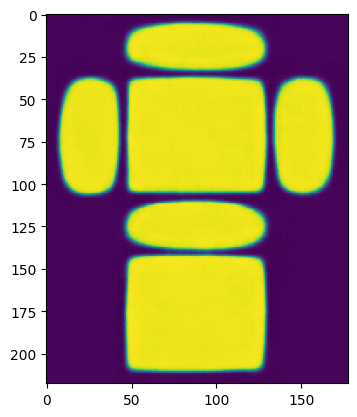

*****************************************************************************************************************
torch.Size([218, 178])


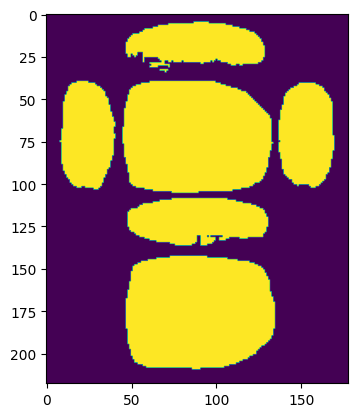

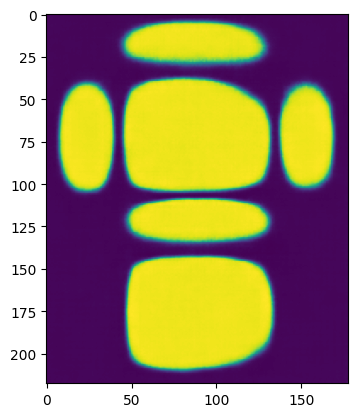

*****************************************************************************************************************
torch.Size([218, 178])


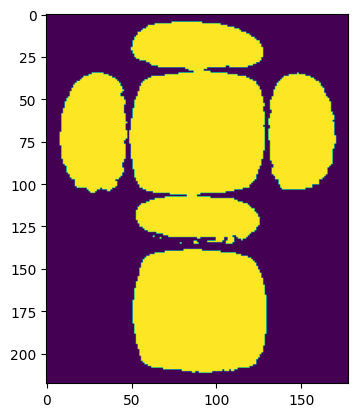

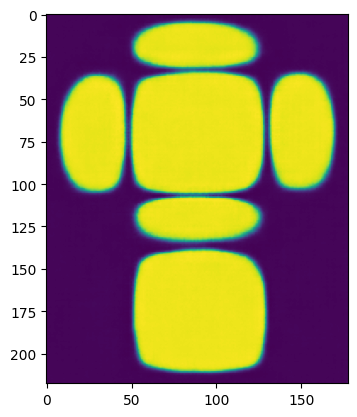

*****************************************************************************************************************
torch.Size([218, 178])


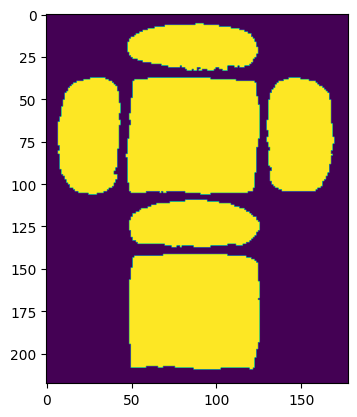

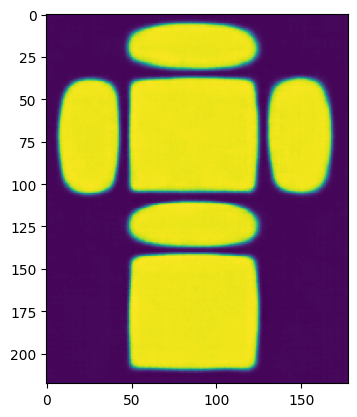

*****************************************************************************************************************
torch.Size([218, 178])


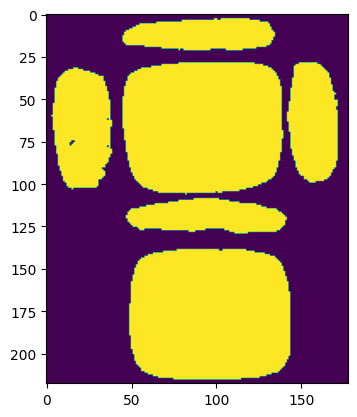

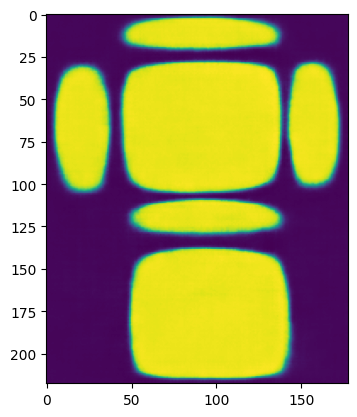

end of epoch 10
*****************************************************************************************************************
torch.Size([218, 178])


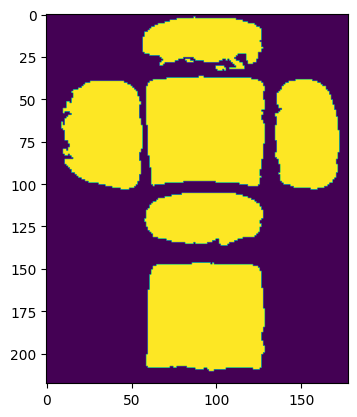

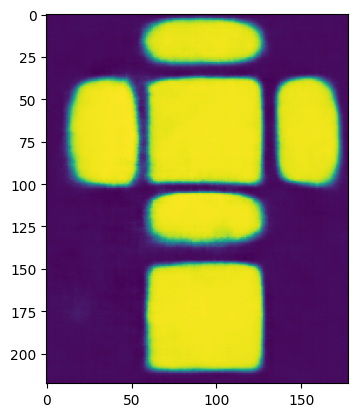

*****************************************************************************************************************
torch.Size([218, 178])


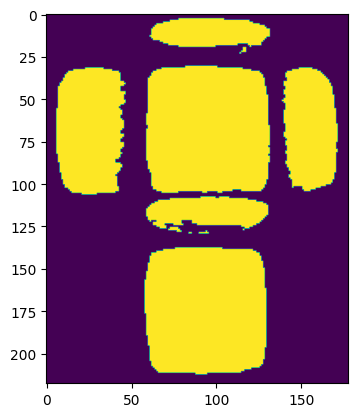

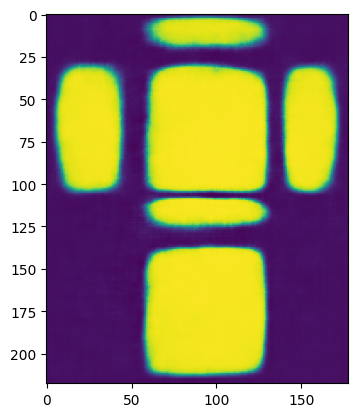

*****************************************************************************************************************
torch.Size([218, 178])


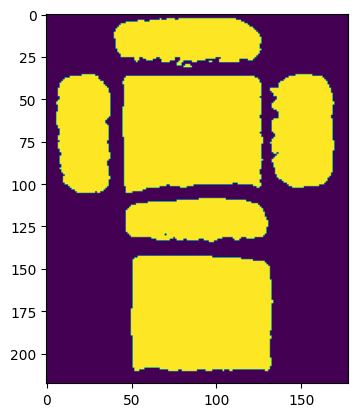

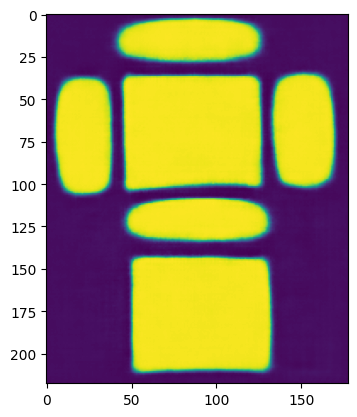

*****************************************************************************************************************
torch.Size([218, 178])


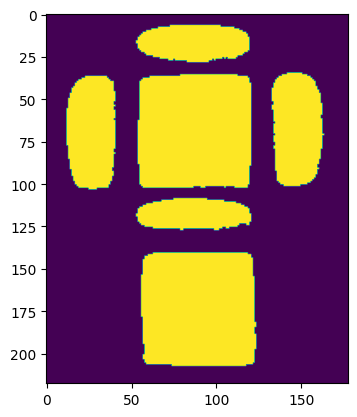

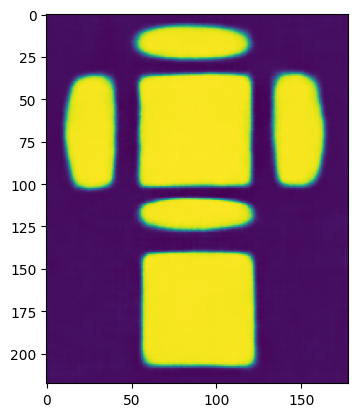

*****************************************************************************************************************
torch.Size([218, 178])


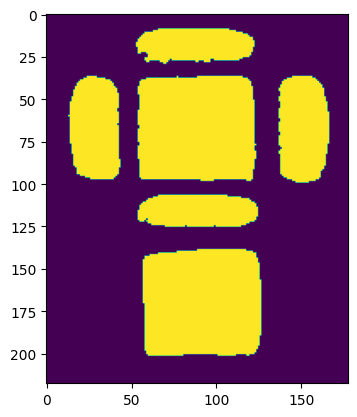

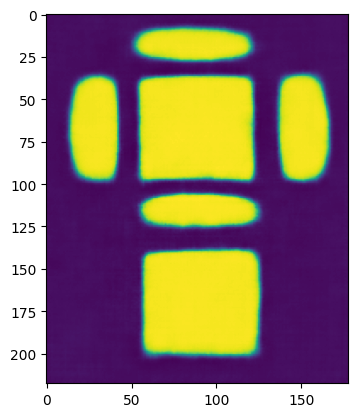

*****************************************************************************************************************
torch.Size([218, 178])


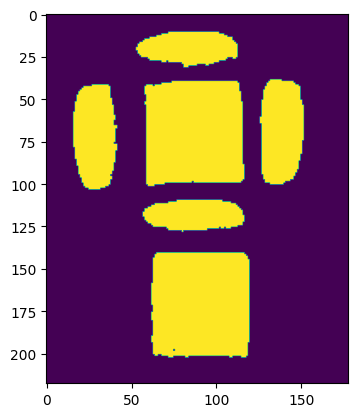

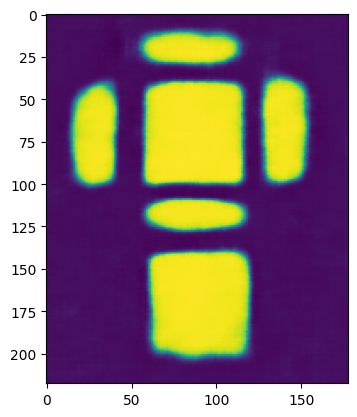

end of epoch 11
*****************************************************************************************************************
torch.Size([218, 178])


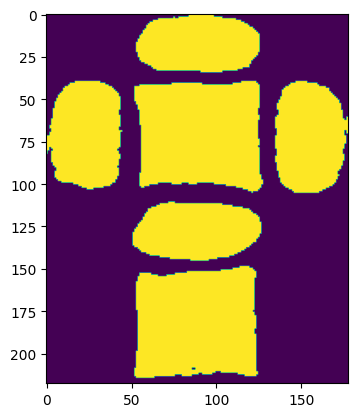

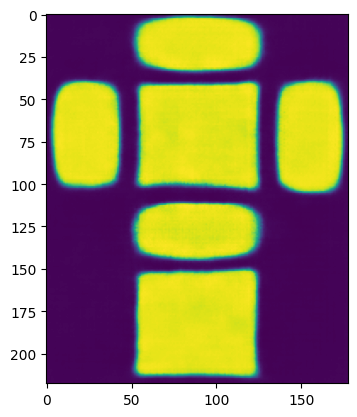

*****************************************************************************************************************
torch.Size([218, 178])


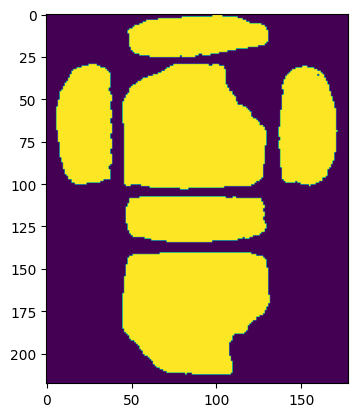

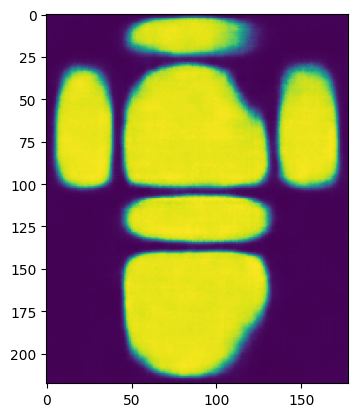

*****************************************************************************************************************
torch.Size([218, 178])


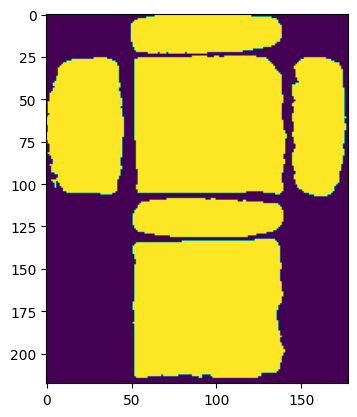

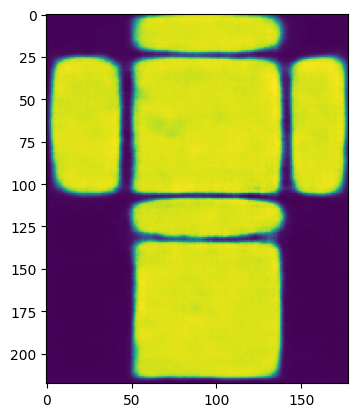

*****************************************************************************************************************
torch.Size([218, 178])


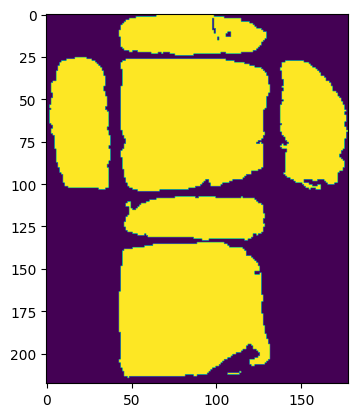

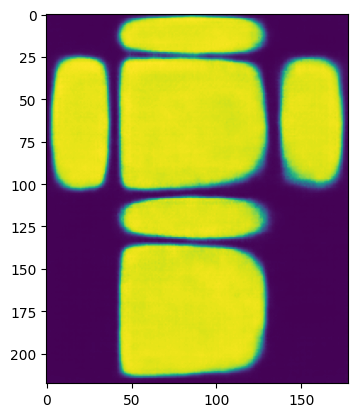

*****************************************************************************************************************
torch.Size([218, 178])


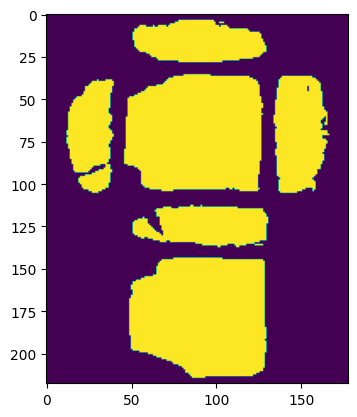

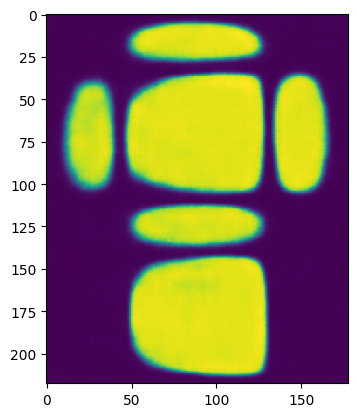

*****************************************************************************************************************
torch.Size([218, 178])


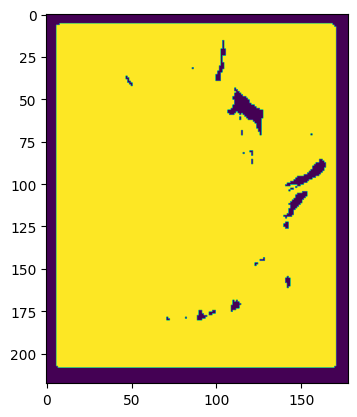

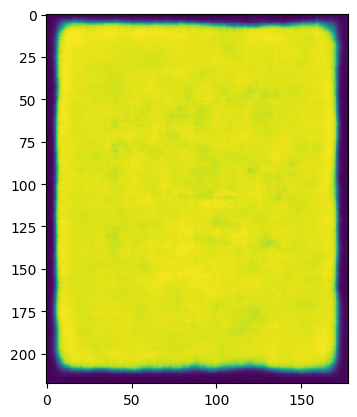

end of epoch 12
*****************************************************************************************************************
torch.Size([218, 178])


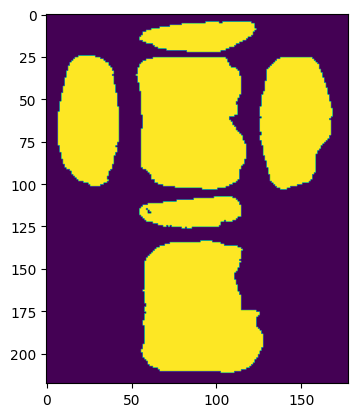

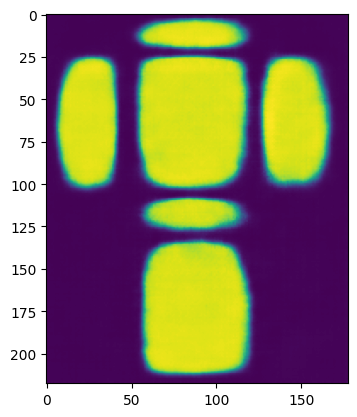

*****************************************************************************************************************
torch.Size([218, 178])


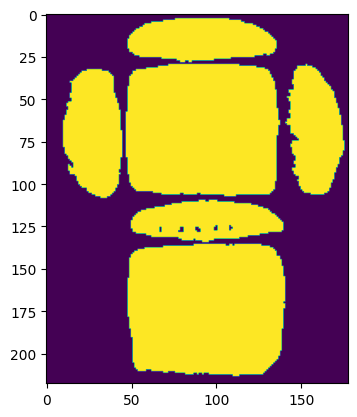

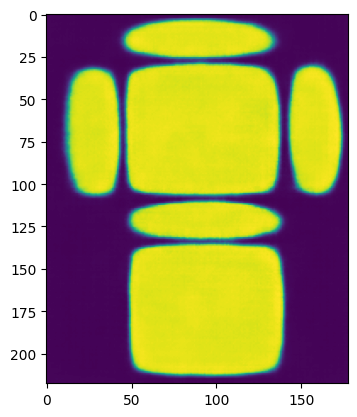

*****************************************************************************************************************
torch.Size([218, 178])


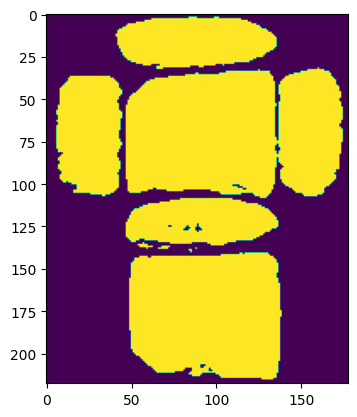

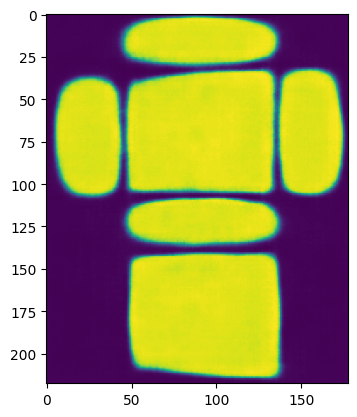

*****************************************************************************************************************
torch.Size([218, 178])


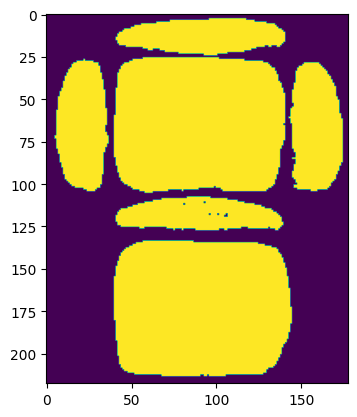

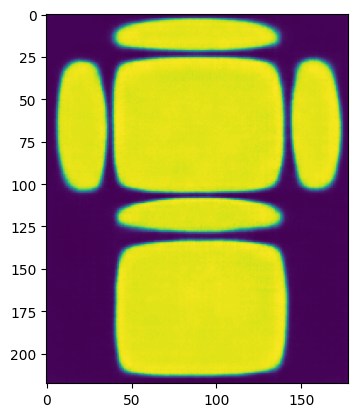

*****************************************************************************************************************
torch.Size([218, 178])


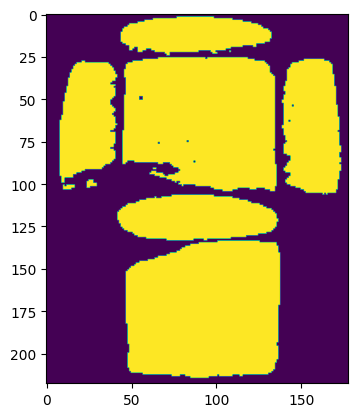

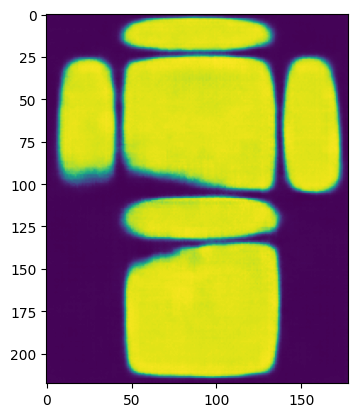

*****************************************************************************************************************
torch.Size([218, 178])


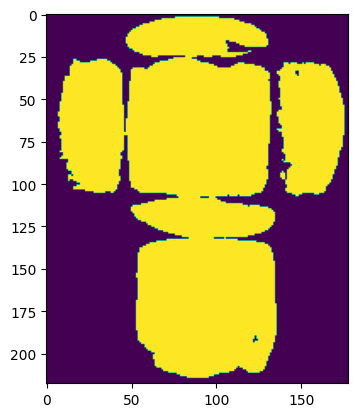

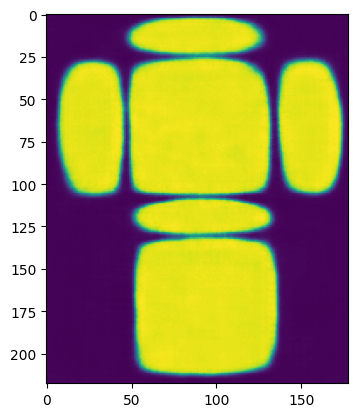

end of epoch 13
*****************************************************************************************************************
torch.Size([218, 178])


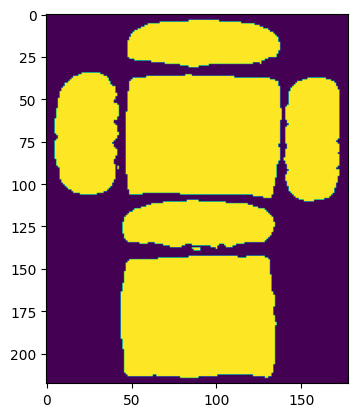

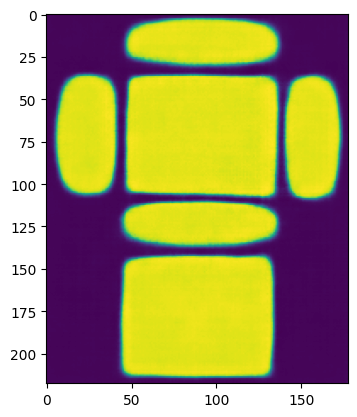

*****************************************************************************************************************
torch.Size([218, 178])


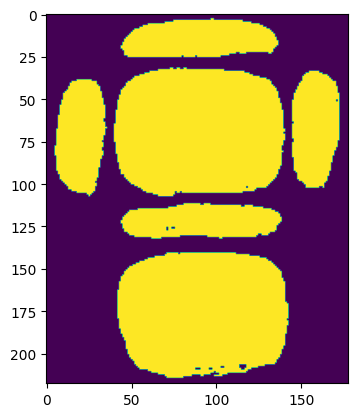

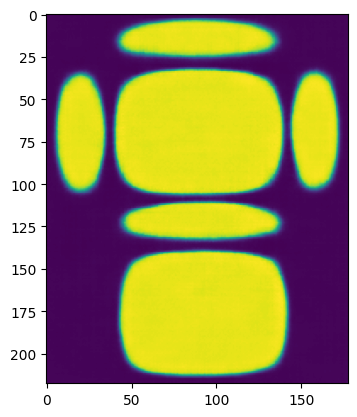

*****************************************************************************************************************
torch.Size([218, 178])


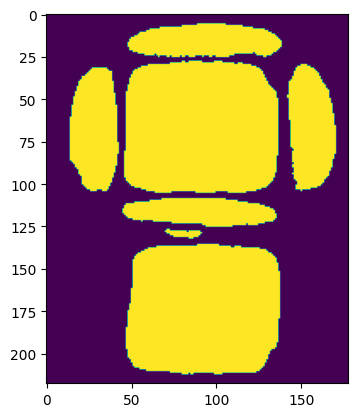

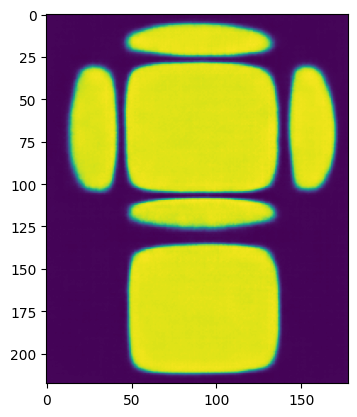

*****************************************************************************************************************
torch.Size([218, 178])


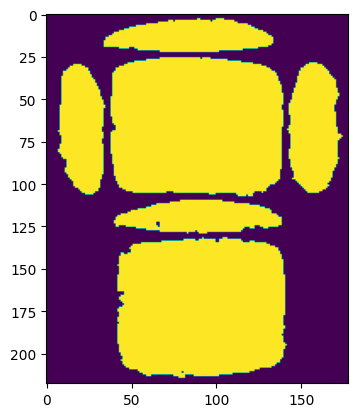

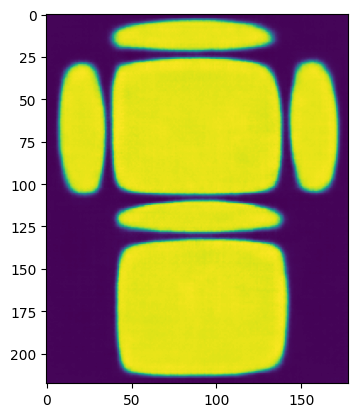

*****************************************************************************************************************
torch.Size([218, 178])


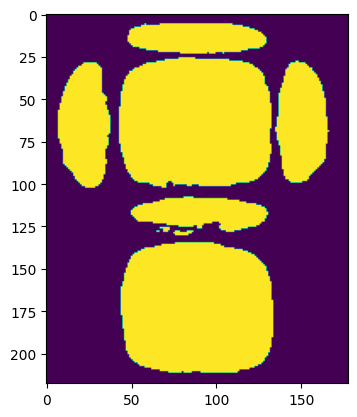

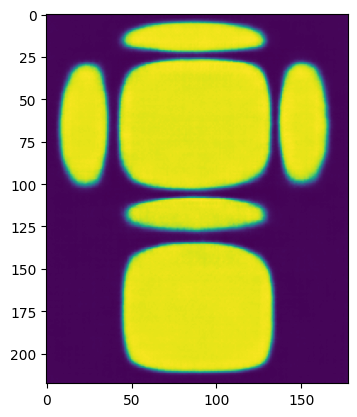

*****************************************************************************************************************
torch.Size([218, 178])


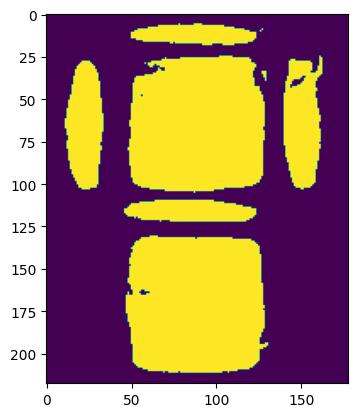

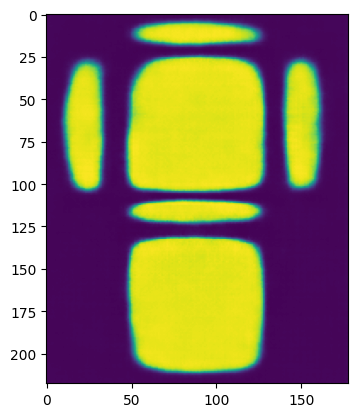

end of epoch 14
*****************************************************************************************************************
torch.Size([218, 178])


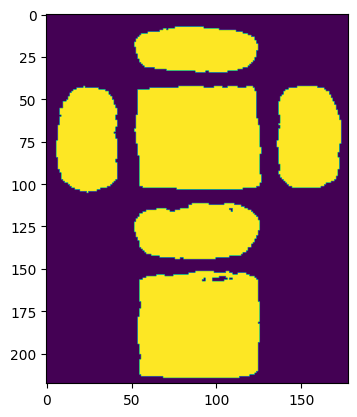

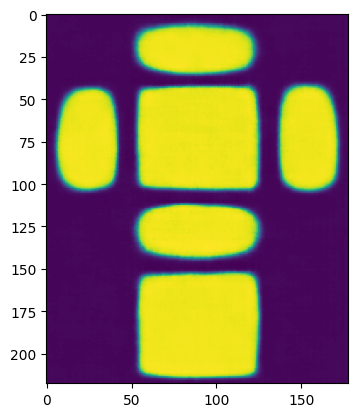

*****************************************************************************************************************
torch.Size([218, 178])


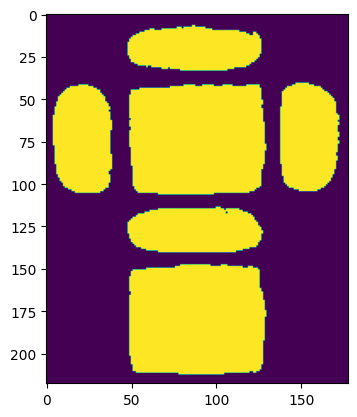

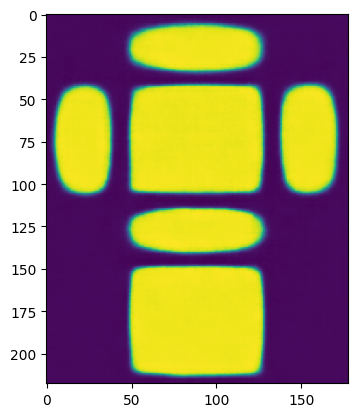

*****************************************************************************************************************
torch.Size([218, 178])


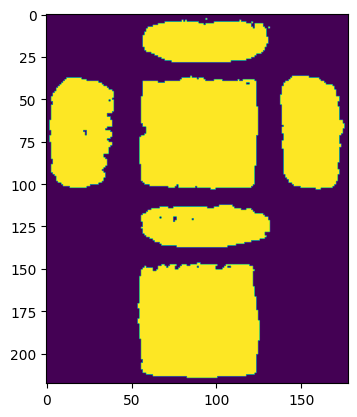

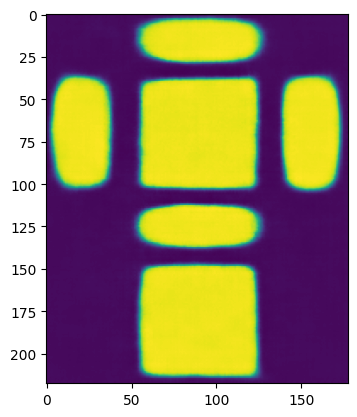

*****************************************************************************************************************
torch.Size([218, 178])


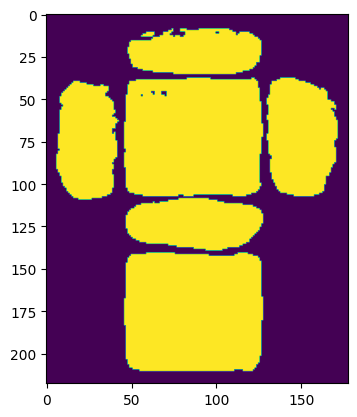

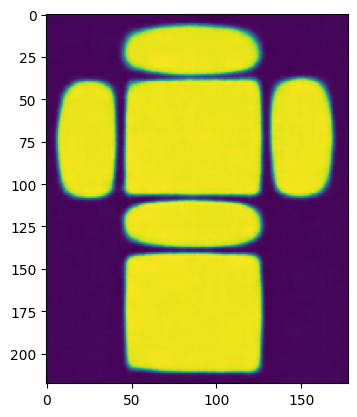

*****************************************************************************************************************
torch.Size([218, 178])


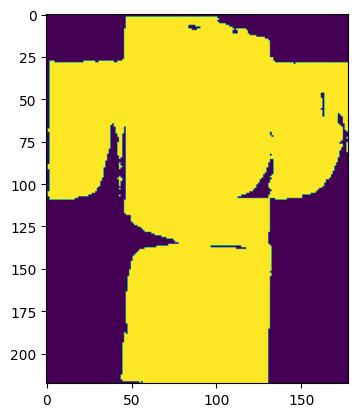

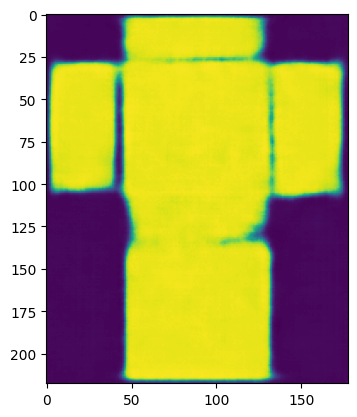

*****************************************************************************************************************
torch.Size([218, 178])


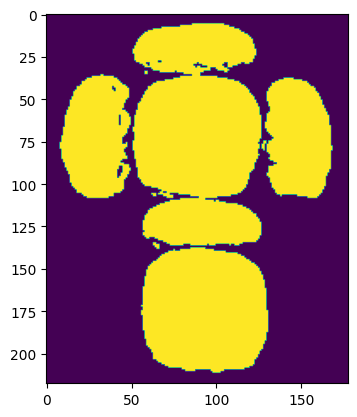

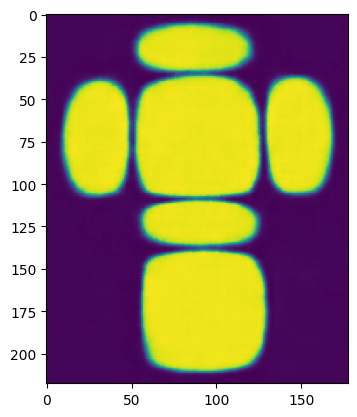

end of epoch 15


In [20]:
# test:
import matplotlib.pyplot as plt
count = 0
for i, batch in enumerate(dl_test):
    
    for count in range (1, 7):
        print("*****************************************************************************************************************")
        x,y = batch
        plt.imshow(  x[count].permute(1, 2, 0)  )
        plt.figure()
        z = model_resume(x)

        plt.imshow(z[0][count][0].detach())    
        print(z[0][count][0].shape)
        plt.show()
    print("end of epoch "+str(i))
    if i==15:
        break